# EDA & Preprocessing for Regression Dataset

## Setup & Imports

In [ ]:
import os, sys

# Dodaj katalog główny projektu do sys.path
project_root = os.path.abspath(os.path.join("..", ".."))
if project_root not in sys.path:
    sys.path.insert(0, project_root)

from bagging_boosting_stacking_study.data.loaders import load_dataset

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from itertools import combinations
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [3]:
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance
import seaborn as sns

## 1. Load Data

In [4]:
df = load_dataset("friedman1")
df

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,target
0,0.543291,0.728951,0.016881,0.330339,0.368722,0.048304,0.104530,0.097438,0.245403,0.873489,...,0.060481,0.238740,0.203699,0.174534,0.415350,0.941738,0.466915,0.959978,0.999814,20.434284
1,0.726317,0.484229,0.126861,0.105405,0.042266,0.244131,0.071517,0.995568,0.201326,0.882451,...,0.115434,0.592202,0.708262,0.130289,0.118507,0.003721,0.569425,0.481840,0.341163,12.704799
2,0.264718,0.347718,0.920715,0.983162,0.976486,0.042755,0.808018,0.866689,0.517983,0.715319,...,0.643628,0.546687,0.559584,0.193267,0.324460,0.181905,0.617393,0.287938,0.134363,21.129467
3,0.326771,0.178520,0.417330,0.376549,0.456134,0.244862,0.704969,0.119836,0.318947,0.777626,...,0.994941,0.093421,0.764512,0.154718,0.557474,0.583331,0.558294,0.722588,0.698426,8.054411
4,0.068049,0.591908,0.699811,0.617643,0.728178,0.186213,0.089812,0.398810,0.233131,0.765922,...,0.801325,0.425200,0.518275,0.461082,0.479880,0.140446,0.766192,0.883264,0.854843,11.369637
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.447657,0.461562,0.408930,0.150446,0.238957,0.288023,0.196839,0.057326,0.629748,0.289980,...,0.878011,0.057234,0.382438,0.047561,0.442253,0.289729,0.568255,0.161089,0.913614,9.068290
4996,0.459648,0.865089,0.067423,0.084752,0.339989,0.991748,0.727463,0.717963,0.356747,0.878014,...,0.133602,0.677935,0.665924,0.019238,0.700168,0.517622,0.349290,0.629199,0.774054,16.023905
4997,0.440252,0.726441,0.919880,0.059161,0.329423,0.481525,0.213477,0.066967,0.504649,0.076581,...,0.375095,0.092239,0.576369,0.875768,0.909426,0.208199,0.764899,0.015964,0.504689,13.510397
4998,0.721434,0.143628,0.131265,0.782056,0.850271,0.296214,0.258553,0.208338,0.111483,0.794399,...,0.688347,0.379078,0.284495,0.712590,0.150000,0.142265,0.328167,0.357269,0.743496,18.183908


## 2. Initial Data Inspection

- Summary of dataset dimensions (number of rows and columns). For example, "The dataset contains 10,000 rows and 15 columns."
- Overview of each column’s data type (numeric, categorical, datetime), and counts of non-null entries. For instance, "Column A is numeric with 95% non-null values."
- A tally of missing values, with a quick interpretation: "Column X has 12% missing—this will require imputation or removal."
- Any immediate red flags (e.g., "Column Y has all-zero values," "Column Z has only one unique value," or "There are 50 duplicated rows").

In [5]:
# Summary of dataset dimensions
print(f"Dataset contains {df.shape[0]} rows and {df.shape[1]} columns.")

summary = pd.DataFrame({
    "Non-Null Count": df.count(),
    "Dtype": df.dtypes
})

print("Full DataFrame info (alternative to df.info()):")
display(summary)

# Missing values
missing_values = df.isnull().sum()
print("\nMissing Values:")
if missing_values.sum() == 0:
    print("No missing values found.")
else:
    display(missing_values[missing_values > 0])

# Check for duplicated rows
duplicated_rows = df.duplicated().sum()
print(f"\nNumber of duplicated rows: {duplicated_rows}")


Dataset contains 5000 rows and 21 columns.
Full DataFrame info (alternative to df.info()):


,Non-Null Count,Dtype
feature_0,5000,float64
feature_1,5000,float64
feature_2,5000,float64
feature_3,5000,float64
feature_4,5000,float64
feature_5,5000,float64
feature_6,5000,float64
feature_7,5000,float64
feature_8,5000,float64
feature_9,5000,float64



Missing Values:
No missing values found.

Number of duplicated rows: 0


## 3. Univariate Descriptions

- A table of descriptive statistics for each numeric column: mean, standard deviation, minimum, maximum, and quartiles.
- Highlights of features whose distributions are heavily skewed or have extreme outliers. Consider using histograms or box plots to visualize these distributions.
- A narrative on the target variable: its range, central tendency, and whether it’s approximately bell-shaped, heavy-tailed, or multimodal.
- Notes on any categorical or discrete columns: number of categories, imbalanced levels, or rare values. For example, "Category A has 90% of the data, while Category B has only 1%."

In [6]:
numeric_df = df.select_dtypes(include="number")

desc_stats = pd.DataFrame({
    "mean": numeric_df.mean(),
    "std": numeric_df.std(),
    "min": numeric_df.min(),
    "25%": numeric_df.quantile(0.25),
    "50% (median)": numeric_df.median(),
    "75%": numeric_df.quantile(0.75),
    "max": numeric_df.max()})

print(desc_stats.round(2))


             mean   std   min    25%  50% (median)    75%    max
feature_0    0.50  0.29  0.00   0.25          0.49   0.75   1.00
feature_1    0.50  0.29  0.00   0.25          0.50   0.75   1.00
feature_2    0.50  0.29  0.00   0.25          0.50   0.75   1.00
feature_3    0.50  0.29  0.00   0.26          0.50   0.75   1.00
feature_4    0.50  0.29  0.00   0.24          0.49   0.75   1.00
feature_5    0.51  0.29  0.00   0.25          0.51   0.76   1.00
feature_6    0.50  0.29  0.00   0.26          0.51   0.74   1.00
feature_7    0.49  0.29  0.00   0.24          0.49   0.74   1.00
feature_8    0.50  0.29  0.00   0.25          0.51   0.76   1.00
feature_9    0.50  0.29  0.00   0.25          0.50   0.75   1.00
feature_10   0.50  0.29  0.00   0.25          0.51   0.74   1.00
feature_11   0.51  0.29  0.00   0.26          0.51   0.77   1.00
feature_12   0.51  0.29  0.00   0.26          0.51   0.75   1.00
feature_13   0.50  0.29  0.00   0.25          0.51   0.75   1.00
feature_14   0.50  0.29  

In [7]:
numeric_df = df.select_dtypes(include="number")

# Skewness
skewness = numeric_df.skew()

# Outlier stats
iqr_outliers = {}
z_outliers = {}
outlier_indices = {}

for col in numeric_df.columns:
    series = numeric_df[col]
    
    # IQR-based
    q1, q3 = series.quantile([0.25, 0.75])
    iqr = q3 - q1
    iqr_bounds = (q1 - 1.5 * iqr, q3 + 1.5 * iqr)
    iqr_mask = (series < iqr_bounds[0]) | (series > iqr_bounds[1])
    iqr_outliers[col] = iqr_mask.sum()

    # Z-score-based
    z_scores = (series - series.mean()) / series.std()
    z_mask = np.abs(z_scores) > 3
    z_outliers[col] = z_mask.sum()

    # Save indices
    outlier_indices[col] = {
        "iqr": series.index[iqr_mask].tolist(),
        "z": series.index[z_mask].tolist()
    }

# DataFrame
summary = pd.DataFrame({
    "Skewness": skewness.round(2),
    "IQR Outliers": pd.Series(iqr_outliers),
    "Z-score Outliers": pd.Series(z_outliers)
})

print(" Skewness & Outliers Summary:")
print(summary)

 Skewness & Outliers Summary:
            Skewness  IQR Outliers  Z-score Outliers
feature_0       0.02             0                 0
feature_1      -0.00             0                 0
feature_2      -0.00             0                 0
feature_3       0.00             0                 0
feature_4       0.02             0                 0
feature_5      -0.03             0                 0
feature_6      -0.01             0                 0
feature_7       0.01             0                 0
feature_8      -0.01             0                 0
feature_9      -0.01             0                 0
feature_10     -0.01             0                 0
feature_11     -0.01             0                 0
feature_12     -0.04             0                 0
feature_13     -0.02             0                 0
feature_14     -0.03             0                 0
feature_15     -0.02             0                 0
feature_16     -0.02             0                 0
feature_17      

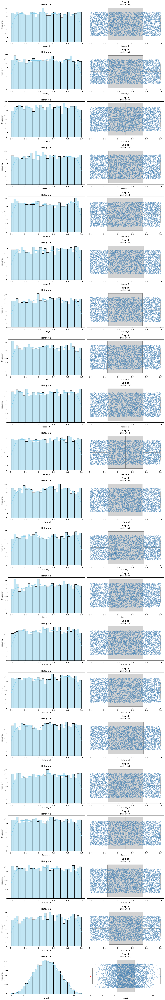

In [8]:
# Zakładamy, że masz już DataFrame df z kolumnami numerycznymi
numeric_df = df.select_dtypes(include="number")
skewness = numeric_df.skew()

# Wyznacz outliery IQR
iqr_outlier_counts = {}
outlier_mask_dict = {}

for col in numeric_df.columns:
    q1, q3 = numeric_df[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    mask = (numeric_df[col] < lower) | (numeric_df[col] > upper)
    iqr_outlier_counts[col] = mask.sum()
    outlier_mask_dict[col] = mask

# Wykresy
features = numeric_df.columns
n = len(features)

fig, axes = plt.subplots(nrows=n, ncols=2, figsize=(14, 4 * n))

for i, col in enumerate(features):
    data = numeric_df[col]
    skew_val = skewness[col]
    out_count = iqr_outlier_counts[col]
    outlier_mask = outlier_mask_dict[col]

    # Histogram
    ax_hist = axes[i, 0]
    sns.histplot(data, kde=True, ax=ax_hist, bins=30, color="skyblue", edgecolor="black")
    ax_hist.set_title(f"Histogram")
    ax_hist.set_xlabel(col)
    ax_hist.set_ylabel("Frequency")

    # Boxplot + scatter
    ax_box = axes[i, 1]
    sns.boxplot(x=data, ax=ax_box, color="lightgray", fliersize=0, zorder=1)  # box z tyłu

    # Jitter
    jitter = np.random.uniform(low=-0.3, high=0.3, size=len(data))

    # Punkty normalne
    ax_box.scatter(
        data[~outlier_mask], jitter[~outlier_mask],
        color="steelblue", alpha=0.4, s=8, zorder=2
    )

    # Punkty odstające
    ax_box.scatter(
        data[outlier_mask], jitter[outlier_mask],
        color="red", alpha=0.8, s=12, zorder=3
    )

    ax_box.set_title(f"Boxplot\n(outliers={out_count})")
    ax_box.set_xlabel(col)
    ax_box.set_yticks([])

plt.tight_layout()
plt.show()

Target variable analysis
• Range: 0.13 – 28.07
• Mean: 14.34
• Median: 14.29
• Skewness: 0.03, approximately symmetric
• Kurtosis: -0.49, mesokurtic (normal-like)
• Modality: unimodal


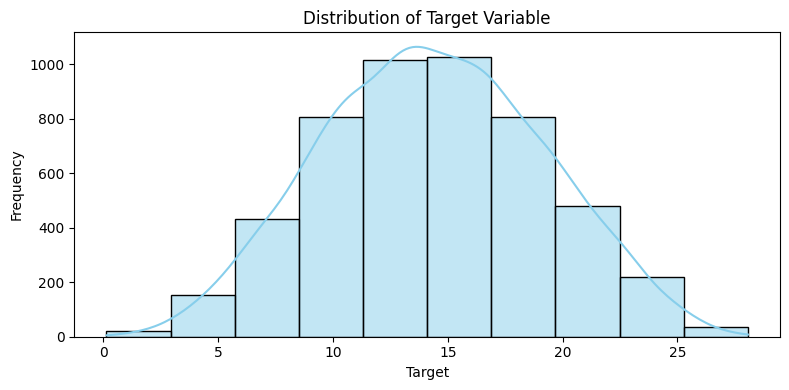

In [9]:
y = df["target"]

stats = {
    "min": y.min(),
    "max": y.max(),
    "mean": y.mean(),
    "median": y.median(),
    "skewness": y.skew(),
    "kurtosis": y.kurtosis()}

symmetry = (
    "approximately symmetric" if abs(stats["skewness"]) < 0.5 else
    "right-skewed" if stats["skewness"] > 0.5 else
    "left-skewed")

tails = (
    "light-tailed" if stats["kurtosis"] < -1 else
    "heavy-tailed" if stats["kurtosis"] > 1 else
    "mesokurtic (normal-like)")


counts, _ = np.histogram(y, bins=10)
peak_count = sum((counts[1:-1] > counts[:-2]) & (counts[1:-1] > counts[2:]))
modality = "multimodal" if peak_count > 1 else "unimodal"

print("Target variable analysis")
print(f"• Range: {stats['min']:.2f} – {stats['max']:.2f}")
print(f"• Mean: {stats['mean']:.2f}")
print(f"• Median: {stats['median']:.2f}")
print(f"• Skewness: {stats['skewness']:.2f}, {symmetry}")
print(f"• Kurtosis: {stats['kurtosis']:.2f}, {tails}")
print(f"• Modality: {modality}")

plt.figure(figsize=(8, 4))
sns.histplot(y, bins=10, kde=True, color="skyblue", edgecolor="black")
plt.title("Distribution of Target Variable")
plt.xlabel("Target")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


There are no categorical or descrete columns in this dataset.

## 4. Outlier & Missing-Value Analysis

- Identification of outliers using summary rules (e.g., values beyond 1.5× IQR or Z-scores greater than `threshold`). For example, "Feature X has 5 outliers beyond 1.5× IQR."
- A discussion of whether to cap, transform, drop them, or leave them as they are. For instance, "Outliers in Feature Y will be capped at the 99th percentile."
- A plan for missing-data handling: which columns to impute (mean, median, KNN), which to drop entirely, and any domain-specific logic (e.g., missing means "unknown").
- A short risk assessment: "Dropping rows will reduce n by 10%; imputing may bias Feature Y."

In [10]:
print(summary[["IQR Outliers", "Z-score Outliers"]])

print("\nOutlier indices by column")
for col, idxs in outlier_indices.items():
    if idxs["iqr"] or idxs["z"]:
        iqr_list = idxs["iqr"] if idxs["iqr"] else None
        z_list = idxs["z"] if idxs["z"] else None
        print(f"{col}: IQR: {iqr_list}, Z-score: {z_list}")


            IQR Outliers  Z-score Outliers
feature_0              0                 0
feature_1              0                 0
feature_2              0                 0
feature_3              0                 0
feature_4              0                 0
feature_5              0                 0
feature_6              0                 0
feature_7              0                 0
feature_8              0                 0
feature_9              0                 0
feature_10             0                 0
feature_11             0                 0
feature_12             0                 0
feature_13             0                 0
feature_14             0                 0
feature_15             0                 0
feature_16             0                 0
feature_17             0                 0
feature_18             0                 0
feature_19             0                 0
target                 1                 0

Outlier indices by column
target: IQR: [2859], Z-scor

### Conclusion

Outliers are present only in the target variable. Since the Friedman1 dataset is synthetically generated, these outliers represent the intended noise structure. Removing or modifying them could artificially reduce the model’s error. Therefore, it is more appropriate to retain them as-is.

In [11]:
# # Missing values
print(df.isnull().sum())

feature_0     0
feature_1     0
feature_2     0
feature_3     0
feature_4     0
feature_5     0
feature_6     0
feature_7     0
feature_8     0
feature_9     0
feature_10    0
feature_11    0
feature_12    0
feature_13    0
feature_14    0
feature_15    0
feature_16    0
feature_17    0
feature_18    0
feature_19    0
target        0
dtype: int64


### Conclusion

No missing values in this dataset.

## 5. Correlation Analysis

- Create a correlation matrix heatmap to visualize pairwise linear relationships among numeric features and the target variable. If the data distribution is far from normal, use Spearman or Kendall correlation methods instead of Pearson.
  - Example: "Feature A and Feature B have a correlation of 0.95, indicating potential multicollinearity."
- Highlight features with strong correlations that might indicate redundancy or multicollinearity concerns. Discuss whether these features should be removed or transformed.
- Discuss any surprising relationships. For instance, "Feature Y and Feature Z are highly correlated despite no obvious domain link."
- Provide guidance on potential feature selection or dimensionality reduction steps. For example:
  - "Features with correlations above 0.8 will be considered for removal to avoid multicollinearity."
  - "Principal Component Analysis (PCA) may be applied to reduce dimensionality while retaining most of the variance."

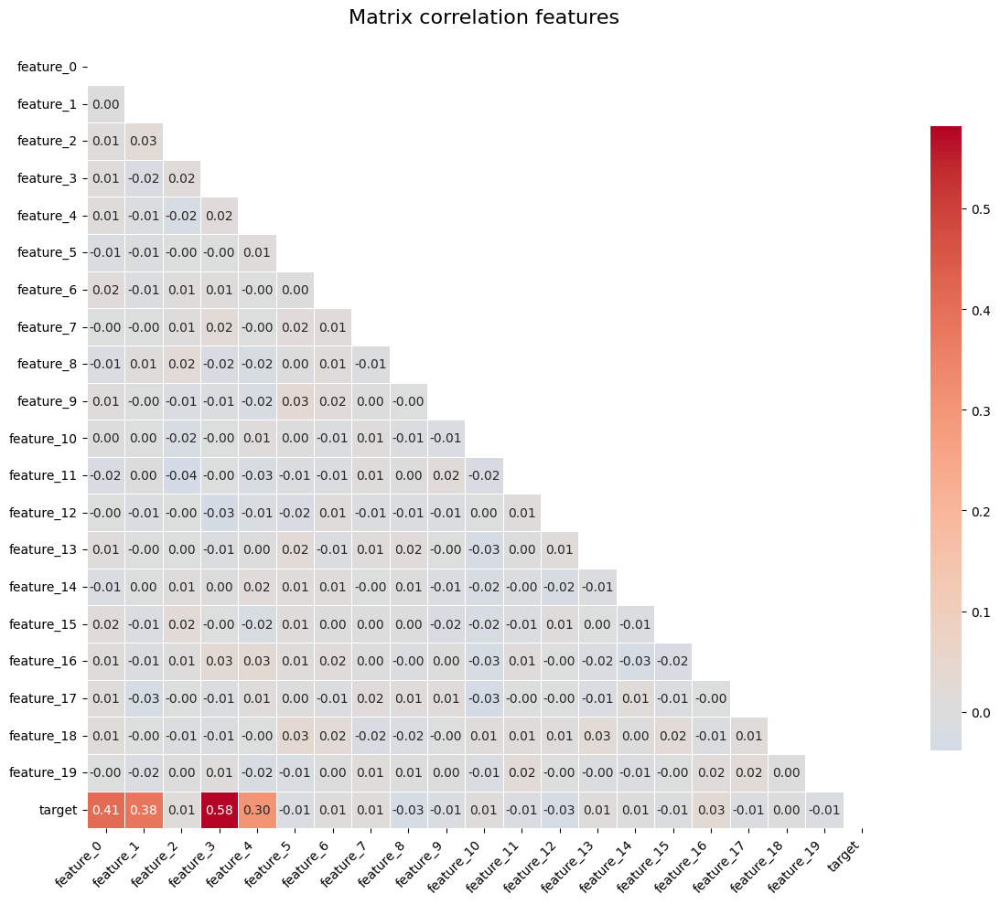

In [12]:
corr_matrix = df.corr(numeric_only=True)

use_mask = True 
mask = np.triu(np.ones_like(corr_matrix, dtype=bool)) if use_mask else None

plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(
    corr_matrix,
    mask=mask,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",  
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)

plt.title("Matrix correlation features", fontsize=16, pad=20)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

In [13]:
# Print max corr between features (excluding target variable)
corr_matrix = df.drop(columns="target").corr().abs()
np.fill_diagonal(corr_matrix.values, 0)
print(corr_matrix.values.max())

0.038167760942765465


In [14]:
# Calculate VIF to double check for multicollinearity concerns
X = df.drop(columns="target")
X_const = add_constant(X)

# Compute VIF for each feature
vif_data = pd.DataFrame({
    "feature": X_const.columns,
    "VIF": [
        variance_inflation_factor(X_const.values, i)
        for i in range(X_const.shape[1])
    ]})

vif_data = vif_data[vif_data.feature != "const"].reset_index(drop=True)
display(vif_data)

,feature,VIF
0,feature_0,1.002240
1,feature_1,1.002775
2,feature_2,1.005158
3,feature_3,1.004429
4,feature_4,1.005512
5,feature_5,1.004320
6,feature_6,1.002633
7,feature_7,1.002145
8,feature_8,1.002734
9,feature_9,1.003677


We compute the correlation matrix of the features. The maximum absolute Pearson correlation between any two features is extremely low (c. 0.038). 

Correspondingly, VIF for each feature is c. 1 (e.g. feature_0 VIF=c. 1.002, feature_19 VIF=c. 1.003). In short, no multicollinearity is present, and we do not need to drop or combine linearly dependent inputs.

By applying a threshold (e.g. |corr(feature, target)| ≥ 0.2), you can drop low-impact variables, leaving only features 0, 1, 3, and 4.

## 6. Multivariate Exploration

- A description of pairwise scatter patterns among top-correlated features and with the target—what shapes (linear, curved, clusters) you see. For example, 
  - "Feature A and Feature B show a linear relationship with some clustering."
  - "Feature X has a strong positive correlation with the target, suggesting it may be a good predictor."
- Insights from a low-dimensional projection (like PCA): whether data forms distinct groups, follows a simple manifold, or exhibits strange clustering. Consider using pair plots or PCA visualizations.
- Any interaction effects you note (e.g., "Feature A only matters when Feature B is high").
- Optional thoughts on unsupervised patterns (e.g., k-means segments) if they seem relevant to downstream stratification or modeling.

In [15]:
corr_with_target = df.corr()["target"].abs().sort_values(ascending=False)
top_feats = corr_with_target.index[1:6]   # skip “target” itself
print("Top features by |corr| to target:", list(top_feats))

Top features by |corr| to target: ['feature_3', 'feature_0', 'feature_1', 'feature_4', 'feature_16']


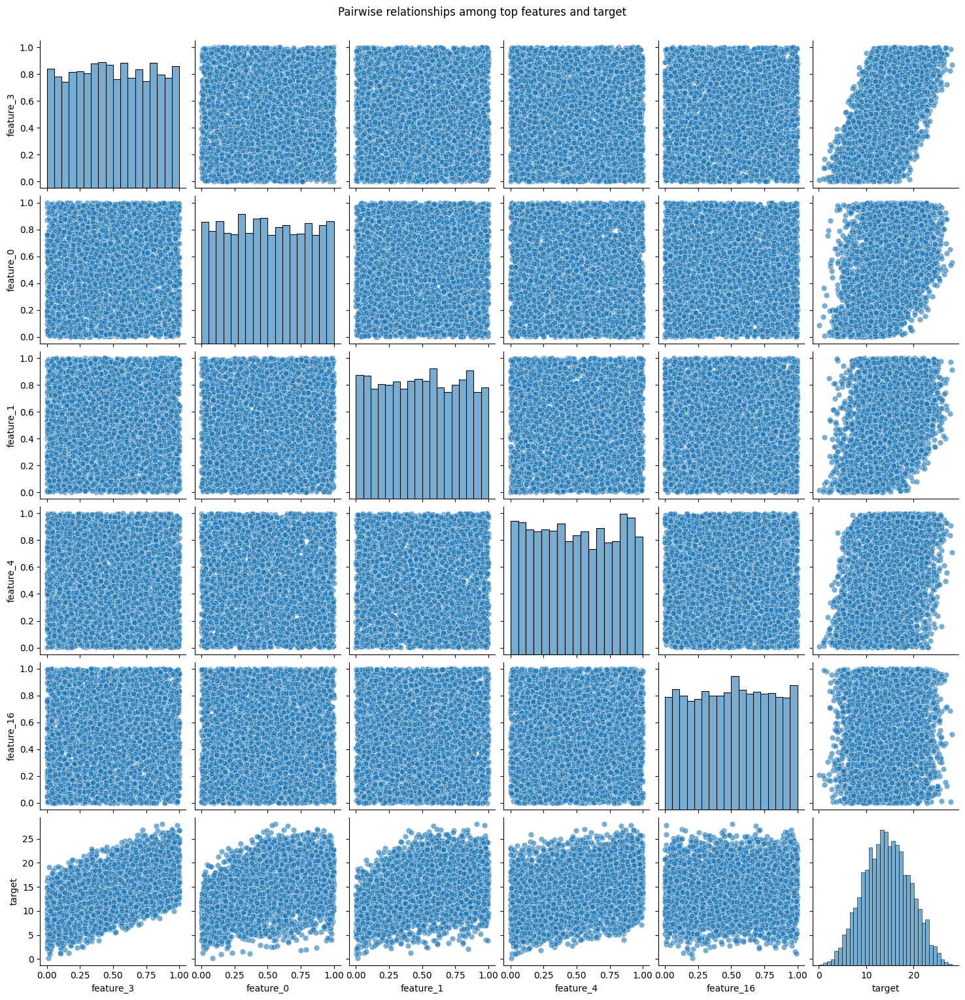

In [16]:
sns.pairplot(
    df[list(top_feats) + ["target"]],
    kind="scatter",
    diag_kind="hist",
    plot_kws={"alpha":0.6, "s":40, "edgecolor":"white"},
    diag_kws={"alpha":0.6})

plt.suptitle("Pairwise relationships among top features and target", y=1.02)
plt.show()

All features show a clear linear relationship with the target (feature_3 shows the strongest linear trend with the target).

No visible nonlinearity, clustering, or need for data transformation.

Correlation strength aligns with trend, supporting a simple linear model.

### Feature Selection

Previous analysis showed that there is no point in searching for additional features through transformations or interactions.  
However, not all features exhibited high correlation with the target variable.

In this subsection, I will explore feature selection methods to identify the most relevant predictors.


In [17]:
SEED = 320804

correlation = df.corr(numeric_only=True)["target"].abs().drop("target")
selected_corr = correlation[correlation >= 0.2].index.tolist()
print("Features after correlation filter:", selected_corr)

X = df[selected_corr]
y = df["target"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=SEED)

scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled  = scaler.transform(X_test)

lasso = LassoCV(cv=5, n_alphas=100, random_state=SEED).fit(X_train_scaled, y_train)
lasso_coefs = pd.Series(lasso.coef_, index=selected_corr)
lasso_selected = lasso_coefs[lasso_coefs != 0].index.tolist()
print("\nFeatures selected by LassoCV:", lasso_selected)

rf = RandomForestRegressor(n_estimators=100, random_state=SEED).fit(X_train, y_train)
perm_result = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=SEED)
perm_scores = pd.Series(perm_result.importances_mean, index=selected_corr).sort_values(ascending=False)
# Tworzenie tabeli z wynikami
perm_df = perm_scores.reset_index()
perm_df.columns = ["Feature", "Importance"]
perm_df = perm_df.round(4).sort_values("Importance", ascending=False)

print("Permutation Importances (Random Forest):")
display(perm_df)

final_features = list(set(lasso_selected) & set(perm_scores[perm_scores > 0].index))
print("\nFinal selected features (Lasso ∩ Permutation):", final_features)

Features after correlation filter: ['feature_0', 'feature_1', 'feature_3', 'feature_4']

Features selected by LassoCV: ['feature_0', 'feature_1', 'feature_3', 'feature_4']
Permutation Importances (Random Forest):


,Feature,Importance
0,feature_3,0.6974
1,feature_1,0.4966
2,feature_0,0.4663
3,feature_4,0.1538



Final selected features (Lasso ∩ Permutation): ['feature_1', 'feature_0', 'feature_3', 'feature_4']


In [18]:
X_all = df.drop(columns="target")
y = df["target"]

correlation = X_all.corrwith(y).abs()
low_corr_features = correlation[correlation < 0.2].index.tolist()
print("Low-correlation features (|corr| < 0.2):")
print(low_corr_features)

X_train, X_test, y_train, y_test = train_test_split(
    X_all, y, test_size=0.2, random_state=42)

scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s  = scaler.transform(X_test)

lasso = LassoCV(cv=5, random_state=0).fit(X_train_s, y_train)
lasso_coefs = pd.Series(lasso.coef_, index=X_all.columns)
selected_lasso = lasso_coefs[lasso_coefs != 0].index.tolist()

print("\nFeatures selected by LassoCV:")
print(selected_lasso)

rf = RandomForestRegressor(n_estimators=100, random_state=0).fit(X_train, y_train)
perm_result = permutation_importance(rf, X_test, y_test, n_repeats=10, random_state=0)
perm_scores = pd.Series(perm_result.importances_mean, index=X_all.columns).sort_values(ascending=False)
selected_perm = perm_scores[perm_scores > 0].index.tolist()

print("\nFeatures with positive permutation importance (RF):")
print(selected_perm)

kept_lasso  = [f for f in low_corr_features if f in selected_lasso]
dropped_lasso = [f for f in low_corr_features if f not in selected_lasso]

kept_perm  = [f for f in low_corr_features if f in selected_perm]
dropped_perm = [f for f in low_corr_features if f not in selected_perm]

print("\nLow-correlation features kept by LassoCV:")
print(kept_lasso or "None")

print("\nLow-correlation features dropped by LassoCV:")
print(dropped_lasso or "None")

print("\nLow-correlation features kept by RF permutation importance:")
print(kept_perm or "None")

print("\nLow-correlation features dropped by RF permutation importance:")
print(dropped_perm or "None")

dropped_by_both = list(set(dropped_lasso) & set(dropped_perm))

print("\nLow-correlation features dropped by BOTH LassoCV and RF permutation importance:")
print(dropped_by_both if dropped_by_both else "None")

Low-correlation features (|corr| < 0.2):
['feature_2', 'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9', 'feature_10', 'feature_11', 'feature_12', 'feature_13', 'feature_14', 'feature_15', 'feature_16', 'feature_17', 'feature_18', 'feature_19']

Features selected by LassoCV:
['feature_0', 'feature_1', 'feature_3', 'feature_4', 'feature_13', 'feature_16']

Features with positive permutation importance (RF):
['feature_3', 'feature_1', 'feature_0', 'feature_4', 'feature_2', 'feature_18', 'feature_14', 'feature_7', 'feature_17', 'feature_15']

Low-correlation features kept by LassoCV:
['feature_13', 'feature_16']

Low-correlation features dropped by LassoCV:
['feature_2', 'feature_5', 'feature_6', 'feature_7', 'feature_8', 'feature_9', 'feature_10', 'feature_11', 'feature_12', 'feature_14', 'feature_15', 'feature_17', 'feature_18', 'feature_19']

Low-correlation features kept by RF permutation importance:
['feature_2', 'feature_7', 'feature_14', 'feature_15', 'feature_17', '

### Inter‐method summary

**Correlation (≥ 0.2):**  
`feature_0`, `feature_1`, `feature_3`, `feature_4`;

**LassoCV ∩ RF perm‐imp selected:**  
`feature_0`, `feature_1`, `feature_3`, `feature_4`;

**LassoCV ∪ RF perm‐imp (all but feature_9):**  
`feature_0`, `feature_1`, `feature_2`, `feature_3`, `feature_4`, `feature_7`, `feature_13`, `feature_14`, `feature_15`, `feature_16`, `feature_17`, `feature_18`.

---

### Recommendation

- **Drop:** `feature_5`, `feature_6`, `feature_8`, `feature_9`, `feature_10`, `feature_11`, `feature_12`, `feature_19` (never selected by any method);  
- **Keep:** the other 10 features — bagging and boosting models will handle residual noise;  
- **Minimal set:** use the **intersection** of LassoCV and RF permutation importance.

## 7. Feature Engineering Plan

- A bullet list of transformations you intend to apply: log or power transforms for skewed distributions, scaling or normalization for models that require it.
- Ideas for derived features: interactions, polynomial terms, binning of continuous variables, or aggregations if relevant.
- Notes on how to encode categorical variables (one-hot, ordinal) and any thresholds (e.g., group rare categories under "Other").
- A rationale for each choice—how it might help bagging, boosting, or stacking models.
- Validate the effectiveness of engineered features by checking feature importance scores or model performance after training.

1. No need for extra features - every relationship that is present is linear.
2. Drop `feature_5`, `feature_6`, `feature_8`, `feature_9`, `feature_10`, `feature_11`, `feature_12`, `feature_19`.

## 8. Preprocessing Pipeline Outline

- Short, step-by-step list of the operations in the order they should run in pipeline:
  1. Missing-value imputation
  2. Outlier capping or removal (and optional imputation of removed outliers)
  3. Feature transforms and scaling
  4. Train/test split configuration -- only if data analysis suggests that specific train/test split could be beneficial / is mandatory (for example time series data)

## Is Scaling Needed?

### Boosting
- **Tree-based methods** (`XGBoost`, `LightGBM`, `CatBoost`) are invariant to monotonic transformations - no scaling needed.
- **Gradient-descent models** (e.g., `AdaBoost` with linear or NN base learners) - scaling helps with convergence and regularization.

### Bagging
- **Tree ensembles** (`RandomForest`, `Bagged Trees`) - no scaling needed.
- **Distance/kernel-based models** (`KNN`, `SVM`, `RBF`) - scaling is important so no feature dominates.

### Stacking
- **Base models** - scale if needed (e.g., linear, `SVM`, `NN`, `KNN`); skip for trees.
- **Meta-learner** - operates on base model predictions — usually no scaling needed unless outputs differ in scale.

No complex pipeline needed — just drop `feature_5`, `feature_6`, `feature_8`, `feature_9`, `feature_10`, `feature_11`, `feature_12`, `feature_19`.
